pip uninstall fancyimpute

In [ ]:
!pip install unrar

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unrar x '/content/gdrive/MyDrive/Colab Notebooks/диплом пробую тут/bmb.rar'


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/gdrive/MyDrive/Colab Notebooks/диплом пробую тут/bmb.rar

Extracting  ОАК январь-июнь.xlsx                                           0%  1%  OK 
Extracting  ОАК справка.txt                                                1%  OK 
Extracting  Визиты февраль.xlsx                                            2%  3%  4%  5%  6%  7%  8%  9% 10%  OK 
Extracting  Визиты справка.txt                                            10%  OK 
Extracting  Визиты март.xlsx                                              11% 12% 13% 14% 15% 16% 17% 18% 19% 20% 21% 22%  OK 
Extracting  Визиты май.xlsx                                               23% 24% 25% 26% 27% 28% 29% 30% 31% 32% 33%  OK 
Extracting  Визиты июнь.xlsx                     

https://mag.103.by/zdorovje/118173-retikulocity-norma-povyshennoje-soderzhanije-v-analize-u-zhenshhin-detej/
показатели ретикулоцитов нереалистичные

# Описание датасета
<details><summary><font size="5">(тык)</font></summary>
    
    ord_id идентификатор направления,
    pat_id идентификатор пациента,
    age возраст пациента на дату исследования,
    gender пол,
    date_result дата результата,
    col1 "СОЭ",
    col2 "Ретикулоциты",
    col3 "МСНС (средняя концентрация гемоглобина в эритроците)",
    col4 "МСН (среднее содержание гемоглобина в отдельном эритроците)",
    col5 "МСV (Средний объем эритроцита)",
    col6 "NE (нейтрофилы) абсолютное содержание",
    col7 "NE %(нейтрофилы) сегментоядерные относительное содержание",
    col8 "NE %(нейтрофилы) палочкоядерные относительное содержание",
    col9 "MO(моноциты) абсолютное содержание",
    col10 "MO%(моноциты) относительное содержание",
    col11 "LY%(лимфоциты) относительное содержание",
    col12 "LY (лимфоциты) абсолютное содержание",
    col13 "EO(эозинофилы) абсолютное содержание",
    col14 "EO%(эозинофилы) относительное содержание",
    col15 "BA (базофилы) абсолютное содержание",
    col16 "BA %(базофилы) относительное содержание",
    col17 "WBC (лейкоциты)",
    col18 "RBC (эритроциты)",
    col19 "PLT (тромбоциты)",
    col20 "PDW (ширина распределения  тромбоцитов)",
    col21 "MPV (средний объем тромбоцитов)",
    col22 "HGB (гемоглобин)",
    col23 "HCT (гематокрит)",
    col24 "Сегментоядерные нейтрофилы",
    col25 "Лимфоциты",
    col26 "Моноциты",
    col27 "Эозинофилы"

In [ ]:
import pandas as pd
from string import punctuation
import numpy as np
from scipy import stats
#from plotly.subplots import make_subplots
#import plotly.express as px
from matplotlib import pyplot as plt
import seaborn as sb
pd.set_option('display.max_columns', 100)

In [ ]:
# экранирование некоторых символов
import re
punc = re.escape(punctuation)
print(punctuation)
print(punc)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~
!"\#\$%\&'\(\)\*\+,\-\./:;<=>\?@\[\\\]\^_`\{\|\}\~


In [ ]:
blood = pd.read_excel('no_refs.xlsx')
blood['date_result'] = blood['date_result'].dt.date
#with_refs = pd.read_excel('with_refs.xlsx')
refs = pd.read_excel('only_refs.xlsx')

# Предобработка анализов

In [ ]:
blood = pd.read_excel('ОАК январь-июнь.xlsx')
blood.drop(columns='ord_id', inplace=True)
blood.drop_duplicates(inplace=True)
#pd.set_option('display.max_rows', 100)

In [ ]:
def cleanGarbage(col):
    #убрать любые буквы с пробелами, пункт в начале, пункт в конце.
    col = col.replace(f'[A-Za-zА-Яа-я]|\s|^[{punc}]+|[{punc}]+$', '', regex=True)
    #а потом любую пунктуацию, если её >= 1, заменить ОДНОЙ точкой и перевести уже столбец в числа
    col = col.replace(f'[{punc}]+', '.', regex=True)
    #Но могут быть строки, где после всех махинаций осталась пунктуация, заменённая точкой, без цифр, её чистим
    col = col.replace(f'^[{punc} ]*$', np.nan, regex=True)
    return col

In [ ]:
blood['gender'] = blood['gender'].map({'Женский' : 0, 'Мужской' : 1})
blood.iloc[:, 5:] = blood.iloc[:, 5:].apply(lambda x: pd.to_numeric(cleanGarbage(x), errors='coerce'))
blood['col3'] = blood['col3'].apply(lambda x: x / 10 if x > 100 else x) #(lambda x : "{:,}".format(x))

### Рефы
<details><summary><font size="3" color="darkblue"><b>рефы</b></font></summary>
    
    # обработка рефов, чтоб спокойно сравнивать с col-ми в случае необходимости
    t = """
    blood.loc[blood['gender'] == 1, 'ref1'] = '1; 10'
    blood.loc[blood['gender'] == 0, 'ref1'] = '2; 15'
    blood['ref2'] = '0.5; 2'
    blood['ref3'] = '31; 38'
    blood['ref4'] = '26; 35'
    blood.loc[blood['gender'] == 1, 'ref5'] = '81; 95'
    blood.loc[blood['gender'] == 0, 'ref5'] = '82; 98'
    blood['ref6'] = '1.5; 5.5'
    blood.loc[blood['age'] <= 1, 'ref7'] = '21; 43'
    blood.loc[blood['age'].between(2, 15), 'ref7'] = '25; 60'
    blood.loc[blood['age'] >= 16, 'ref7'] = '47; 72'
    blood['ref8'] = '1; 6'
    blood['ref9'] = '0.08; 0.99'
    blood.loc[blood['age'] <= 1, 'ref10'] = '3.8; 10.2'
    blood.loc[blood['age'] > 1, 'ref10'] = '3; 11'
    blood.loc[blood['age'] <= 1, 'ref11'] = '45; 67'
    blood.loc[blood['age'].between(2, 12), 'ref11'] = '30; 55'
    blood.loc[blood['age'] >= 12, 'ref11'] = '20; 40'
    blood['ref12'] = '0.72; 4.41'
    blood['ref13'] = '0.0; 0.45'
    blood['ref14'] = '1; 5'
    blood['ref15'] = '0.0; 0.064'
    blood['ref16'] = '0.0; 1.6'
    blood.loc[blood['age'] <= 1, 'ref17'] = '6; 17.5'
    blood.loc[blood['age'].between(1, 7, inclusive='right'), 'ref17'] = '5.5; 15.5'
    blood.loc[blood['age'].between(8, 17), 'ref17'] = '4.5; 13.5'
    blood.loc[blood['age'] >= 18, 'ref17'] = '4; 9'
    blood.loc[blood['gender'] == 1, 'ref18'] = '4.5; 5.9'
    blood.loc[blood['gender'] == 0, 'ref18'] = '4.1; 5.1'
    blood.loc[blood['age'] <= 1, 'ref19'] = '180; 490'
    blood.loc[blood['age'] > 1, 'ref19'] = '180; 400'
    blood['ref20'] = '9; 17'
    blood['ref21'] = '5; 12'
    blood.loc[blood['gender'] == 1, 'ref22'] = '130; 160'
    blood.loc[blood['gender'] == 0, 'ref22'] = '120; 140'
    blood.loc[blood['age'] <= 1, 'ref22'] = '111; 129'
    blood.loc[blood['gender'] == 1, 'ref23'] = '39; 50'
    blood.loc[blood['gender'] == 0, 'ref23'] = '35; 47'
    blood['ref24'] = '30; 70'
    blood['ref25'] = '25; 40'
    blood['ref26'] = ''; blood['ref27'] = ''
    #ref 26-27 СОВЕРШЕННО НЕПОНЯТНО, ОТ ЧЕГО, АБС ИЛИ ОТН, КАВО, ЕЩЁ И СТОЛБЦЫ НЕ ПОЙМИ КАК ЗАПОЛНЕНЫ"""
    #s = re.sub("'\n", ']\n', t)
    #s = re.sub("= '", '= [', s)

<details><summary><font size="3" color="darkblue"><b>рефы блад</b></font></summary>

    blood.loc[blood['gender'] == 1, 'ref1'] = '1; 10'
    blood.loc[blood['gender'] == 0, 'ref1'] = '2; 15'
    blood['ref2'] = '0.5; 2'
    blood['ref3'] = '31; 38'
    blood['ref4'] = '26; 35'
    blood.loc[blood['gender'] == 1, 'ref5'] = '81; 95'
    blood.loc[blood['gender'] == 0, 'ref5'] = '82; 98'
    blood['ref6'] = '1.5; 5.5'
    blood.loc[blood['age'] <= 1, 'ref7'] = '21; 43'
    blood.loc[blood['age'].between(2, 15), 'ref7'] = '25; 60'
    blood.loc[blood['age'] >= 16, 'ref7'] = '47; 72'
    blood['ref8'] = '1; 6'
    blood['ref9'] = '0.08; 0.99'
    blood.loc[blood['age'] <= 1, 'ref10'] = '3.8; 10.2'
    blood.loc[blood['age'] > 1, 'ref10'] = '3; 11'
    blood.loc[blood['age'] <= 1, 'ref11'] = '45; 67'
    blood.loc[blood['age'].between(2, 12), 'ref11'] = '30; 55'
    blood.loc[blood['age'] >= 12, 'ref11'] = '20; 40'
    blood['ref12'] = '0.72; 4.41'
    blood['ref13'] = '0.0; 0.45'
    blood['ref14'] = '1; 5'
    blood['ref15'] = '0.0; 0.064'
    blood['ref16'] = '0.0; 1.6'
    blood.loc[blood['age'] <= 1, 'ref17'] = '6; 17.5'
    blood.loc[blood['age'].between(1, 7, inclusive='right'), 'ref17'] = '5.5; 15.5'
    blood.loc[blood['age'].between(8, 17), 'ref17'] = '4.5; 13.5'
    blood.loc[blood['age'] >= 18, 'ref17'] = '4; 9'
    blood.loc[blood['gender'] == 1, 'ref18'] = '4.5; 5.9'
    blood.loc[blood['gender'] == 0, 'ref18'] = '4.1; 5.1'
    blood.loc[blood['age'] <= 1, 'ref19'] = '180; 490'
    blood.loc[blood['age'] > 1, 'ref19'] = '180; 400'
    blood['ref20'] = '9; 17'
    blood['ref21'] = '5; 12'
    blood.loc[blood['gender'] == 1, 'ref22'] = '130; 160'
    blood.loc[blood['gender'] == 0, 'ref22'] = '120; 140'
    blood.loc[blood['age'] <= 1, 'ref22'] = '111; 129'
    blood.loc[blood['gender'] == 1, 'ref23'] = '39; 50'
    blood.loc[blood['gender'] == 0, 'ref23'] = '35; 47'
    blood['ref24'] = '30; 70'
    blood['ref25'] = '25; 40'
    blood['ref26'] = ''; blood['ref27'] = ''
    #ref 26-27 СОВЕРШЕННО НЕПОНЯТНО, ОТ ЧЕГО, АБС ИЛИ ОТН, КАВО, ЕЩЁ И СТОЛБЦЫ НЕ ПОЙМИ КАК ЗАПОЛНЕНЫ"""

    #refbl = pd.DataFrame(blood['pat_id'])
    for i in range(1, np.count_nonzero(blood.columns.str.startswith('ref'))-1):
        blood[[f'ref{i}.0', f'ref{i}.1']] = blood[f'ref{i}'].str.split(';', n=1, expand=True)
    blood.drop(columns=blood.filter(regex='ref\d{1,2}$').columns, inplace=True)

    refs = blood.filter(regex='ref|id').copy()
    refs.head()

    blood.to_excel('with_refs.xlsx', index=False)
    blood.drop(columns=blood.columns[blood.columns.str.startswith('ref')], axis=1, inplace=True)
    blood.info()

In [ ]:
blood.to_excel('no_refs.xlsx', index=False)
refs.to_excel('only_refs.xlsx', index=False)

## Предобработка диагнозов
<details>
    <summary><font size="3" color="darkgreen"><b>Просто объединение визитов за кадром</b></font></summary>
    
    visit1 = pd.read_excel('Визиты за январь.xlsx')
    visit2 = pd.read_excel('Визиты февраль.xlsx')
    visit3 = pd.read_excel('Визиты март.xlsx')
    visit4 = pd.read_excel('Визиты апрель.xlsx')
    visit5 = pd.read_excel('Визиты май.xlsx')
    visit6 = pd.read_excel('Визиты июнь.xlsx')
    visits = pd.concat([visit1, visit2, visit3, visit4, visit5, visit6])
    visits.drop_duplicates(inplace=True)
    visits.to_csv('ОБЪЕДИНЁННЫЕ ВИЗИТЫ.csv', index=False)
    padi = visits[['01.Пациент', '19.Дата начала случая', '20.Дата окончания случая',
                   '14.Характер заболевания', '05.Диагноз', '22. Сопутствующие диагнозы']].copy()
    padi.drop_duplicates(inplace=True)
    padi = padi[padi['05.Диагноз'].notna()]
    padi = padi[padi['01.Пациент'].notna()]
    padi.rename(columns = {'01.Пациент' : 'pat_id', '19.Дата начала случая' : 'date_start',
                    '20.Дата окончания случая' : 'date_end', '14.Характер заболевания' : 'category',
                    '05.Диагноз' : 'diag', '22. Сопутствующие диагнозы' : 'concomitant'}, inplace=True)
    padi.to_csv('ПАЦИЕНТ_ДИАГНОЗ.csv', index=False)

In [ ]:
#Диагнозы из всех визитов, столбцы:
#01.Пациент, 03.Дата визита, 14.Характер заболевания, 05.Диагноз, 22. Сопутствующие диагнозы
diag = pd.read_csv('ПАЦИЕНТ_ДИАГНОЗ.csv')
diag.drop_duplicates(inplace=True)
diag[diag['diag'].isna()]
diag['date_start'] = pd.to_datetime(diag['date_start'])
diag['date_end'] = pd.to_datetime(diag['date_end'])
diag['diag'] = diag['diag'].replace('\.\d+$', '', regex = True) #Чистим основные и сопутствующие диагнозы от мусора
diag['concomitant'] = diag['concomitant'].str.replace(' ', '')
diag['concomitant'] = diag['concomitant'].replace('\.\d*;|\.\d*$', ';', regex = True)

In [ ]:
diag.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1491880 entries, 0 to 1491879
Data columns (total 6 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   pat_id       1491880 non-null  object        
 1   date_start   1491880 non-null  datetime64[ns]
 2   date_end     1491880 non-null  datetime64[ns]
 3   category     869536 non-null   object        
 4   diag         1491880 non-null  object        
 5   concomitant  101055 non-null   object        
dtypes: datetime64[ns](2), object(4)
memory usage: 79.7+ MB


In [ ]:
diag[diag['concomitant'].notna()]

,pat_id,date_start,date_end,category,diag,concomitant
13,08427b9b-c5c9-4969-9412-e169e0f1d29b,2023-01-31,2023-01-31,Острое,M16,G57;
22,be01e511-e8ab-4c42-99aa-4a3711829186,2023-01-17,2023-01-17,Ранее установленное хроническое,C50,I11;I20;
37,7f14b5ea-3c84-496f-be63-c4b55528131f,2023-01-31,2023-01-31,NaN,Z24,Z25;
41,9d23d06a-9f58-48d0-a1a9-4ed51a99f089,2023-01-11,2023-01-13,Ранее установленное хроническое,H35,H27;
79,2c264204-1fa6-4a1c-8f49-83a1dfe4412f,2023-01-25,2023-01-25,Ранее установленное хроническое,M93,E66;
...,...,...,...,...,...,...
1491830,0f4ee4ea-030f-4b7b-8e27-307843d08ed4,2023-06-19,2023-06-23,Острое,H66,J00
1491849,e811abfd-a3bc-451f-9093-c53003694509,2023-06-13,2023-06-13,Продолжение лечения хронического заболевания,I25,I50;
1491856,c4415097-c77f-4c61-895f-5379e34d8dfc,2023-06-02,2023-06-02,Ранее установленное хроническое,H52,H50;
1491859,f65c2745-21a1-465d-8b17-4baf09aa8a99,2023-06-28,2023-06-28,Ранее установленное хроническое,A46,E11;


In [ ]:
#Объединяем диагнозы в единый столбец
diag['concomitant'] = diag['concomitant'].fillna('')
diag['diag'] = diag['diag'] + ';' + diag['concomitant'] + ';'

In [ ]:
#Берём из blood даты, чтоб отсеять лишних людей и их диагнозы
id_diag = pd.merge(blood, diag[['pat_id', 'date_start', 'date_end', 'diag']], on='pat_id', how='left')
id_diag.drop_duplicates(inplace=True)
id_diag['date_start'] = pd.to_datetime(id_diag['date_start']).dt.date
id_diag['date_end'] = pd.to_datetime(id_diag['date_end']).dt.date
id_diag[30:]

,pat_id,age,gender,date_result,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,date_start,date_end,diag
30,3e477871-f82e-463a-b96b-0d96caff4f28,82,1,2023-01-03,25.0,NaN,NaN,NaN,NaN,NaN,51.3,NaN,NaN,9.4,35.6,NaN,NaN,3.4,NaN,0.3,6.8,4.55,271.0,NaN,NaN,130.0,NaN,NaN,NaN,NaN,NaN,2023-05-24,2023-05-24,I67;G63;;
31,3e477871-f82e-463a-b96b-0d96caff4f28,82,1,2023-01-03,25.0,NaN,NaN,NaN,NaN,NaN,51.3,NaN,NaN,9.4,35.6,NaN,NaN,3.4,NaN,0.3,6.8,4.55,271.0,NaN,NaN,130.0,NaN,NaN,NaN,NaN,NaN,2023-05-26,2023-05-26,E11;;
32,3e477871-f82e-463a-b96b-0d96caff4f28,82,1,2023-01-03,25.0,NaN,NaN,NaN,NaN,NaN,51.3,NaN,NaN,9.4,35.6,NaN,NaN,3.4,NaN,0.3,6.8,4.55,271.0,NaN,NaN,130.0,NaN,NaN,NaN,NaN,NaN,2023-06-21,2023-06-21,E11;;
33,3e477871-f82e-463a-b96b-0d96caff4f28,82,1,2023-01-03,25.0,NaN,NaN,NaN,NaN,NaN,51.3,NaN,NaN,9.4,35.6,NaN,NaN,3.4,NaN,0.3,6.8,4.55,271.0,NaN,NaN,130.0,NaN,NaN,NaN,NaN,NaN,2023-06-16,2023-06-16,E11;;
34,5cefbef8-425c-4996-8a04-4cc22d856007,77,1,2023-01-03,10.0,NaN,NaN,NaN,NaN,NaN,39.5,NaN,NaN,7.3,51.9,NaN,NaN,1.2,NaN,0.1,4.7,4.73,155.0,NaN,NaN,134.0,NaN,NaN,NaN,NaN,NaN,2023-01-10,2023-01-10,C61;;
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216323,f8ac39c1-bcef-487f-bc17-6b1127eca7d9,48,1,2023-06-29,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1,5.58,193.0,NaN,NaN,173.0,NaN,55.0,30.0,13.0,2.0,2023-06-27,2023-06-27,J34;;
216324,fc311239-1f6a-4437-a748-439bd034ab94,70,0,2023-06-29,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.9,4.67,199.0,NaN,NaN,139.0,NaN,48.0,43.0,7.0,2.0,2023-04-10,2023-04-28,S52;;
216325,fc311239-1f6a-4437-a748-439bd034ab94,70,0,2023-06-29,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.9,4.67,199.0,NaN,NaN,139.0,NaN,48.0,43.0,7.0,2.0,2023-05-18,2023-05-18,M19;;
216326,fc311239-1f6a-4437-a748-439bd034ab94,70,0,2023-06-29,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.9,4.67,199.0,NaN,NaN,139.0,NaN,48.0,43.0,7.0,2.0,2023-06-26,2023-06-26,K30;;


In [ ]:
id_diag['diag'].isna().sum()

459

In [ ]:
#id_diag.loc[27443]
id_diag[id_diag['pat_id'] == '9dbb0d0b-41f3-47aa-b873-1efa0f97ab35']

,pat_id,age,gender,date_result,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,date_start,date_end,diag
27442,9dbb0d0b-41f3-47aa-b873-1efa0f97ab35,13,1,2023-01-19,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1,4.65,265.0,NaN,NaN,138.0,NaN,42.0,48.0,9.0,1.0,2023-01-17,2023-01-17,Z01;;
27443,9dbb0d0b-41f3-47aa-b873-1efa0f97ab35,13,1,2023-01-19,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1,4.65,265.0,NaN,NaN,138.0,NaN,42.0,48.0,9.0,1.0,2023-01-09,2023-01-09,Z10;;
27444,9dbb0d0b-41f3-47aa-b873-1efa0f97ab35,13,1,2023-01-19,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1,4.65,265.0,NaN,NaN,138.0,NaN,42.0,48.0,9.0,1.0,2023-02-09,2023-02-09,Z10;;
27445,9dbb0d0b-41f3-47aa-b873-1efa0f97ab35,13,1,2023-01-19,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1,4.65,265.0,NaN,NaN,138.0,NaN,42.0,48.0,9.0,1.0,2023-04-25,2023-04-25,J35;;
27446,9dbb0d0b-41f3-47aa-b873-1efa0f97ab35,13,1,2023-01-19,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1,4.65,265.0,NaN,NaN,138.0,NaN,42.0,48.0,9.0,1.0,2023-04-17,2023-04-17,H52;;


In [ ]:
print(id_diag['pat_id'].unique().shape)
print(blood['pat_id'].unique().shape)

(27990,)
(27990,)


In [ ]:
# не считаем диагнозы, поставленные раньше анализа крови (всё-таки именно ОАК рассматриваем), а также позже 16 дней.
# заменяем пока всё !, т.к. при группировке и конкатенации диагнозов нельзя посчитать NaN-ы, поэтому пока '!', потом заreplaceим
id_diag.loc[id_diag['date_end'] < id_diag['date_result'], 'diag'] = '!'
id_diag.loc[(id_diag['date_end'] - id_diag['date_result']) > pd.Timedelta(days=16), 'diag'] = '!'

In [ ]:
#id_diag.drop(id_diag[id_diag['date_end'] < id_diag['date_result']].index, inplace=True)
id_diag.drop_duplicates(inplace=True)
id_diag

,pat_id,age,gender,date_result,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,date_start,date_end,diag
0,0f547e64-76ed-4f29-a054-d6890827ea75,49,0,2023-01-03,25.0,NaN,30.1,20.7,68.8,NaN,30.6,NaN,NaN,9.4,56.9,NaN,NaN,2.7,NaN,0.4,4.7,4.39,182.0,NaN,NaN,91.0,30.2,NaN,NaN,NaN,NaN,2023-01-11,2023-01-11,D64;;
1,0f547e64-76ed-4f29-a054-d6890827ea75,49,0,2023-01-03,25.0,NaN,30.1,20.7,68.8,NaN,30.6,NaN,NaN,9.4,56.9,NaN,NaN,2.7,NaN,0.4,4.7,4.39,182.0,NaN,NaN,91.0,30.2,NaN,NaN,NaN,NaN,2023-02-28,2023-03-03,!
2,0f547e64-76ed-4f29-a054-d6890827ea75,49,0,2023-01-03,25.0,NaN,30.1,20.7,68.8,NaN,30.6,NaN,NaN,9.4,56.9,NaN,NaN,2.7,NaN,0.4,4.7,4.39,182.0,NaN,NaN,91.0,30.2,NaN,NaN,NaN,NaN,2023-02-22,2023-02-22,!
3,0f547e64-76ed-4f29-a054-d6890827ea75,49,0,2023-01-03,25.0,NaN,30.1,20.7,68.8,NaN,30.6,NaN,NaN,9.4,56.9,NaN,NaN,2.7,NaN,0.4,4.7,4.39,182.0,NaN,NaN,91.0,30.2,NaN,NaN,NaN,NaN,2023-05-29,2023-05-29,!
4,0f547e64-76ed-4f29-a054-d6890827ea75,49,0,2023-01-03,25.0,NaN,30.1,20.7,68.8,NaN,30.6,NaN,NaN,9.4,56.9,NaN,NaN,2.7,NaN,0.4,4.7,4.39,182.0,NaN,NaN,91.0,30.2,NaN,NaN,NaN,NaN,2023-06-01,2023-06-05,!
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216323,f8ac39c1-bcef-487f-bc17-6b1127eca7d9,48,1,2023-06-29,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1,5.58,193.0,NaN,NaN,173.0,NaN,55.0,30.0,13.0,2.0,2023-06-27,2023-06-27,!
216324,fc311239-1f6a-4437-a748-439bd034ab94,70,0,2023-06-29,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.9,4.67,199.0,NaN,NaN,139.0,NaN,48.0,43.0,7.0,2.0,2023-04-10,2023-04-28,!
216325,fc311239-1f6a-4437-a748-439bd034ab94,70,0,2023-06-29,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.9,4.67,199.0,NaN,NaN,139.0,NaN,48.0,43.0,7.0,2.0,2023-05-18,2023-05-18,!
216326,fc311239-1f6a-4437-a748-439bd034ab94,70,0,2023-06-29,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.9,4.67,199.0,NaN,NaN,139.0,NaN,48.0,43.0,7.0,2.0,2023-06-26,2023-06-26,!


In [ ]:
# Группируем по id, оставляем все диагнозы за указанный период
base_df = id_diag.groupby(list(blood.columns), as_index=False, dropna=False)['diag'].sum().copy()
#(r'\b(\w+)( \1\b)+', r'\1', no_punc)
base_df['diag'].replace('!+', '', regex=True, inplace=True)
base_df['diag'].replace('^$', np.nan, regex=True, inplace=True)
base_df.drop(['pat_id', 'date_result'], axis=1, inplace=True) #id не несёт инфы
# хотя с датой хорошо б что-нибудь придумать... но уже потом...
base_df

,age,gender,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,diag
0,86,0,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.4,4.04,411.0,NaN,NaN,92.0,NaN,50.0,40.0,8.0,2.0,NaN
1,64,0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.9,4.33,265.0,NaN,NaN,128.0,NaN,68.0,25.0,4.0,3.0,NaN
2,10,0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.1,5.53,248.0,NaN,NaN,147.0,NaN,34.0,58.0,5.0,3.0,J30;;
3,9,1,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.5,5.20,163.0,NaN,NaN,139.0,NaN,38.0,57.0,3.0,NaN,J04;;
4,15,0,35.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.6,4.30,266.0,NaN,NaN,135.0,NaN,59.0,37.0,2.0,1.0,J06;;
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32108,54,0,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.4,4.08,209.0,NaN,NaN,145.0,NaN,50.0,37.0,10.0,3.0,NaN
32109,43,0,25.0,NaN,NaN,NaN,NaN,NaN,57.4,NaN,NaN,5.6,31.0,NaN,NaN,5.6,NaN,0.4,10.0,4.31,349.0,NaN,NaN,123.0,NaN,NaN,NaN,NaN,NaN,N80;;
32110,0,1,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,3.32,256.0,NaN,NaN,100.0,NaN,34.0,49.0,9.0,8.0,J00;;
32111,67,0,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.7,4.40,128.0,NaN,NaN,150.0,NaN,50.0,38.0,8.0,4.0,K30;;


anti_join = pd.merge(blood, diag, on='pat_id', how='left', indicator=True)
#select only rows that do not appear in df2
anti_join = anti_join[anti_join['_merge'] == 'left_only']

anti_join

### Наиболее заполненные: 22, 1, 17, 18, 19, 25, 24, 26, 27, 7, 10, 11, 14, 16
как будто не страшно удалить? 6, 9, 12, 15, 20-21

хз 2, 3, 4, 5, 8, 13, 23,

In [ ]:
base_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32113 entries, 0 to 32112
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     32113 non-null  int64  
 1   gender  32113 non-null  int64  
 2   col1    31394 non-null  float64
 3   col2    175 non-null    float64
 4   col3    827 non-null    float64
 5   col4    824 non-null    float64
 6   col5    829 non-null    float64
 7   col6    129 non-null    float64
 8   col7    11095 non-null  float64
 9   col8    249 non-null    float64
 10  col9    134 non-null    float64
 11  col10   11118 non-null  float64
 12  col11   11122 non-null  float64
 13  col12   121 non-null    float64
 14  col13   119 non-null    float64
 15  col14   9058 non-null   float64
 16  col15   108 non-null    float64
 17  col16   5494 non-null   float64
 18  col17   31389 non-null  float64
 19  col18   31342 non-null  float64
 20  col19   31328 non-null  float64
 21  col20   28 non-null     float64
 22

<Axes: >

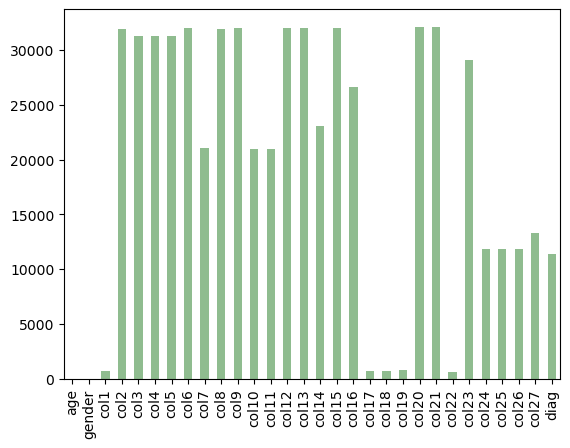

In [ ]:
#Столбчатая диаграмма пропущенных значений
np.sum(base_df.isna(), axis=0).plot.bar(color='darkseagreen')

In [ ]:
#миллион выбросов. Опять ставить запятые самостоятельно????
base_df.describe(include='all')

,age,gender,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,diag
count,32113.000000,32113.000000,31394.000000,175.000000,827.000000,824.000000,829.000000,129.000000,11095.000000,249.000000,134.000000,11118.000000,11122.000000,121.000000,119.000000,9058.000000,108.000000,5494.000000,31389.000000,31342.000000,31328.000000,28.000000,24.000000,31436.000000,3064.000000,20280.000000,20282.000000,20255.000000,18840.000000,20721
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7070
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Z00;;
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1754
mean,36.067792,0.379005,14.014250,10.913771,32.941959,26.981432,83.017732,27.084729,50.085503,8.408032,4.009701,7.578528,39.793408,21.817521,1.666807,2.866853,0.525648,0.645015,7.079325,4.834557,274.441308,68.407143,19.045833,140.066010,36.852944,51.080562,38.860630,7.604962,2.426693,NaN
std,26.676456,0.485147,34.991596,94.207575,2.311696,10.910424,79.311276,24.310174,16.641885,18.119004,3.739973,9.769242,14.407716,21.507472,2.275178,2.514766,1.559629,3.874023,4.578334,8.361951,89.348397,107.411710,33.899442,889.727069,9.365960,13.468302,12.418202,2.988755,2.081859,NaN
min,0.000000,0.000000,0.000000,0.000000,11.000000,2.200000,49.500000,0.880000,0.000000,0.000000,0.210000,0.100000,0.040000,0.900000,0.030000,0.000000,0.000000,0.000000,1.000000,0.730000,2.170000,5.000000,5.000000,4.230000,0.000000,3.000000,1.000000,1.000000,0.000000,NaN
25%,10.000000,0.000000,5.000000,0.020000,31.800000,23.275000,72.800000,3.830000,42.300000,0.100000,0.412500,5.900000,30.600000,2.290000,0.180000,1.400000,0.040000,0.300000,5.500000,4.300000,218.000000,15.800000,8.775000,123.000000,33.100000,43.000000,31.000000,6.000000,1.000000,NaN
50%,35.000000,0.000000,10.000000,0.060000,32.900000,27.000000,81.100000,15.000000,51.200000,0.900000,4.150000,7.200000,37.950000,19.000000,0.650000,2.200000,0.060000,0.500000,6.670000,4.630000,263.000000,16.150000,9.250000,134.000000,36.000000,52.000000,38.000000,8.000000,2.000000,NaN
75%,61.000000,1.000000,19.000000,0.110000,33.900000,30.400000,87.900000,50.700000,59.200000,3.000000,6.775000,8.800000,46.600000,40.400000,2.550000,3.500000,0.500000,0.700000,8.100000,4.970000,318.000000,18.725000,10.350000,146.000000,39.800000,60.000000,46.000000,10.000000,3.000000,NaN


Из описания очевидно наличие выбросов в каждом столбце, поэтому откинем везде по 5%

In [ ]:
problems = list(base_df.columns[2:-1])
problems.remove('col3')
problems.remove('col6')
problems.remove('col9')

In [ ]:
for c in problems:
    q = base_df[c].quantile(0.95)
    base_df.loc[base_df[c] > q, c] = np.nan

Стало СИЛЬНО лучше, но всё ещё беспокоят col6, col8, col12, col20. Можно попробовать удалить ещё 20%, но такие выбросы остались в изначально малочисленных признаках.

In [ ]:
base_df.describe(include='all')

,age,gender,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,diag
count,32113.000000,32113.000000,29992.000000,168.000000,827.000000,782.000000,788.000000,129.000000,10546.000000,236.000000,134.000000,10595.000000,10566.000000,115.000000,113.000000,8610.00000,102.000000,5242.000000,29819.000000,29809.000000,29765.000000,26.000000,22.000000,29921.000000,2912.000000,19350.000000,19275.000000,19765.000000,18011.000000,20721
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7070
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Z00;;
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1754
mean,36.067792,0.379005,12.135267,0.433988,32.941959,26.163171,79.194797,27.084729,48.639319,5.494915,4.009701,7.186396,37.980142,19.314957,1.288053,2.46500,0.234020,0.502367,6.697150,4.567097,262.423528,49.323077,9.050000,132.105599,35.889670,49.920088,37.369831,7.431444,2.116312,NaN
std,26.676456,0.485147,9.432931,1.151320,2.311696,4.460962,9.916551,24.310174,12.579786,13.497075,3.739973,1.854520,11.131227,18.829171,1.495453,1.51466,0.262819,0.289088,1.772185,0.487057,66.507812,84.587603,1.463118,17.171695,4.825702,11.719302,10.449788,2.543932,1.272641,NaN
min,0.000000,0.000000,0.000000,0.000000,11.000000,2.200000,49.500000,0.880000,0.000000,0.000000,0.210000,0.100000,0.040000,0.900000,0.030000,0.00000,0.000000,0.000000,1.000000,0.730000,2.170000,5.000000,5.000000,4.230000,0.000000,3.000000,1.000000,1.000000,0.000000,NaN
25%,10.000000,0.000000,5.000000,0.020000,31.800000,23.100000,72.400000,3.830000,41.700000,0.100000,0.412500,5.800000,30.200000,2.275000,0.180000,1.30000,0.040000,0.300000,5.400000,4.280000,215.000000,15.800000,8.725000,122.000000,33.000000,43.000000,30.000000,6.000000,1.000000,NaN
50%,35.000000,0.000000,9.000000,0.050000,32.900000,26.600000,80.300000,15.000000,50.500000,0.400000,4.150000,7.000000,37.200000,4.160000,0.430000,2.10000,0.050000,0.400000,6.500000,4.600000,258.000000,16.050000,9.200000,134.000000,35.700000,51.000000,37.000000,8.000000,2.000000,NaN
75%,61.000000,1.000000,17.000000,0.110000,33.900000,29.900000,86.700000,50.700000,57.800000,2.000000,6.775000,8.500000,45.000000,37.300000,2.100000,3.30000,0.400000,0.600000,7.850000,4.910000,307.000000,16.500000,9.750000,144.000000,39.100000,59.000000,45.000000,9.000000,3.000000,NaN


for i in [6, 8]: #[8, 20]
    c = f'col{i}'
    q = blood[c].quantile(0.80)
    blood.loc[blood[c] > q, c] = np.nan
    #blood = blood.dropna(subset=c)

In [ ]:
base_df[base_df['col14'].notnull()].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8610 entries, 5 to 32109
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     8610 non-null   int64  
 1   gender  8610 non-null   int64  
 2   col1    8248 non-null   float64
 3   col2    46 non-null     float64
 4   col3    199 non-null    float64
 5   col4    196 non-null    float64
 6   col5    193 non-null    float64
 7   col6    26 non-null     float64
 8   col7    8065 non-null   float64
 9   col8    193 non-null    float64
 10  col9    28 non-null     float64
 11  col10   8332 non-null   float64
 12  col11   8534 non-null   float64
 13  col12   23 non-null     float64
 14  col13   21 non-null     float64
 15  col14   8610 non-null   float64
 16  col15   29 non-null     float64
 17  col16   4996 non-null   float64
 18  col17   8342 non-null   float64
 19  col18   8348 non-null   float64
 20  col19   8205 non-null   float64
 21  col20   19 non-null     float64
 22 

In [ ]:
base_df[base_df['col16'].notnull()].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5242 entries, 7 to 32109
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     5242 non-null   int64  
 1   gender  5242 non-null   int64  
 2   col1    5077 non-null   float64
 3   col2    41 non-null     float64
 4   col3    196 non-null    float64
 5   col4    193 non-null    float64
 6   col5    191 non-null    float64
 7   col6    31 non-null     float64
 8   col7    4968 non-null   float64
 9   col8    148 non-null    float64
 10  col9    30 non-null     float64
 11  col10   5026 non-null   float64
 12  col11   5185 non-null   float64
 13  col12   28 non-null     float64
 14  col13   27 non-null     float64
 15  col14   4996 non-null   float64
 16  col15   22 non-null     float64
 17  col16   5242 non-null   float64
 18  col17   5104 non-null   float64
 19  col18   5037 non-null   float64
 20  col19   5031 non-null   float64
 21  col20   20 non-null     float64
 22 

In [ ]:
base_df[base_df['col23'].notnull()].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2912 entries, 21 to 32104
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     2912 non-null   int64  
 1   gender  2912 non-null   int64  
 2   col1    2497 non-null   float64
 3   col2    9 non-null      float64
 4   col3    801 non-null    float64
 5   col4    759 non-null    float64
 6   col5    762 non-null    float64
 7   col6    18 non-null     float64
 8   col7    1153 non-null   float64
 9   col8    93 non-null     float64
 10  col9    19 non-null     float64
 11  col10   1175 non-null   float64
 12  col11   1186 non-null   float64
 13  col12   17 non-null     float64
 14  col13   18 non-null     float64
 15  col14   1082 non-null   float64
 16  col15   20 non-null     float64
 17  col16   1078 non-null   float64
 18  col17   2666 non-null   float64
 19  col18   2818 non-null   float64
 20  col19   2683 non-null   float64
 21  col20   20 non-null     float64
 22

# Сколько удовлетворяет реферным значениям

In [ ]:
with_refs = pd.read_excel('with_refs.xlsx')

In [ ]:
nearefs = pd.Series(dtype='int', index=blood.columns[5:-2])
for i in range(1, len(nearefs)+1):
    nearefs[f'col{i}'] = np.sum(with_refs[f'col{i}'].between(with_refs[f'ref{i}.0'], with_refs[f'ref{i}.1']))

<Axes: >

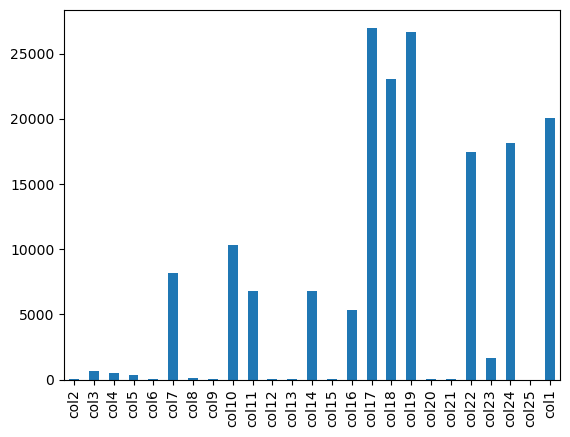

In [ ]:
nearefs.plot.bar()

# df.filter(regex='ref\d{1,2}$')

<details><summary><font size="3" color="darkblue"><b>не тык</b></font></summary>

# Типа плана
    опр-м самые значимые признаки
выборка по значениям корреляции с ответом
отдельная выборка из отобранных переменных, взять из них те, где не так много пропусков
выбирать только те признаки, где ответы правильно упакованы (самые частые укрупнённые болезни)
частотная гистограмма пропущенных признаков
строить распр-е болезней

Когда будет список болезней
отсечение
(не частые болезни не выбрасывать, а пометить иначе, например "другое")

возможно, многослойный персептрон
структурно-параметрический синтез

<details>
  <summary><font size="3" color="#F5F5F5"><b>о долгих затупах на память</b></font></summary>

чот побольше надо было сохранить, жалко
    #!pip install ydata-profiling
    #!pip install pandas-profiling[notebook]
    
    df.replace({0: 10, 1: 100}) - просто замена
    df.replace({'A': 0, 'B': 5}, 100) - замена 0 в А и 5 в B на 100
    df.replace({'A': {0: 100, 4: 400}}) - замена в А 0 на 100 и 4 на 400
   
\D - т.к. есть 1'27''', 63 !!! и т.п., а они отсекаются им, цифры со словами

Отсечь с \w из-за тех же цифр со словами

\d подходит???

    mkb = pd.read_excel('Spravochnik_MKB-10.xlsx')
    mkb_reduced = mkb[mkb['mkb_cod'].str.contains('^\w{1}\d{2}$') == True]
    mkb_reduced.to_excel('SOKRASCHONYI_MKB-10.xlsx', index=False)

а мучалась я с:

    blood['col1'][blood['col1'].str.contains(f'{punc}?\d+{punc}?\d*{punc}?', na=True) == True]
    blood['col1'][2577:].str.replace(f'[A-Za-zА-Яа-я ]|^[{punctuation}]+|[{punctuation}]+$', '', regex=True)
blood['col1'][6290:].str.replace(f'[A-Za-zА-Яа-я ]|^[{punctuation}]+|[{punctuation}]+$', '', regex=True)

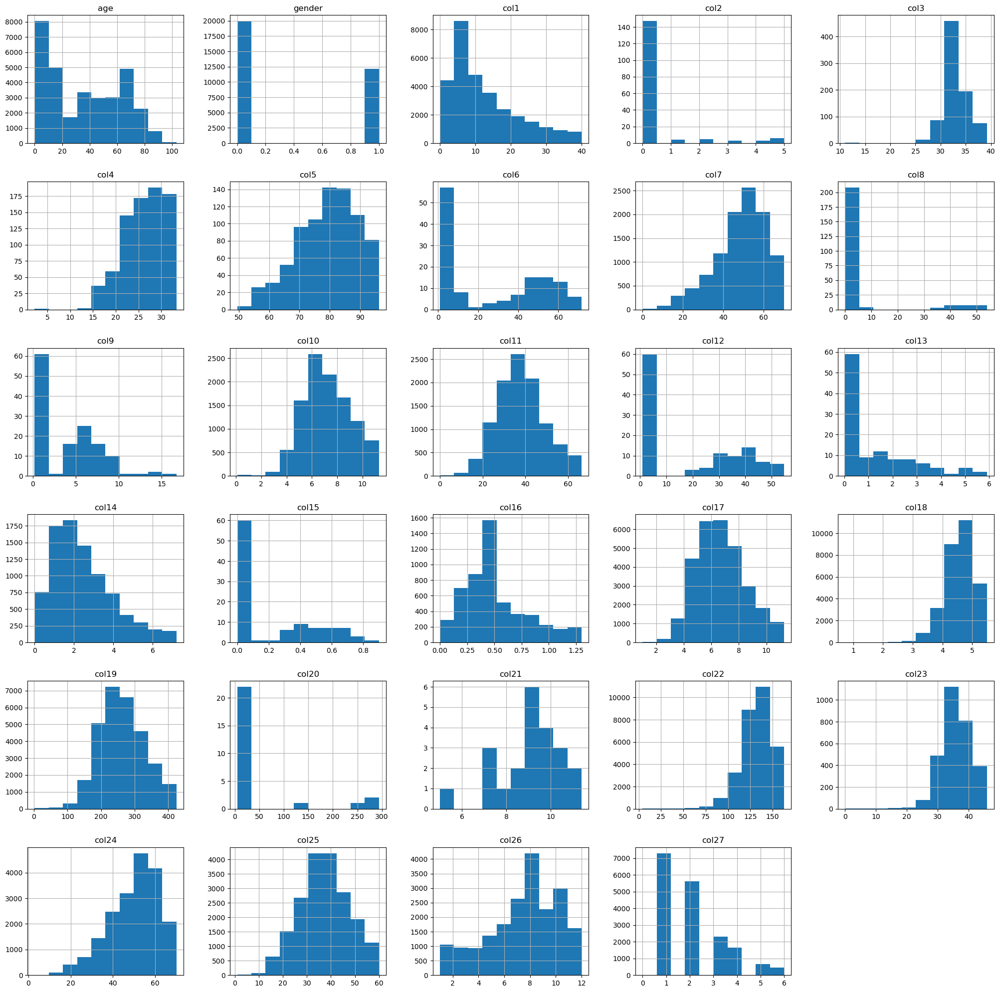

In [ ]:
base_df.hist(figsize=(25, 25))
plt.show()

# Удаление и заполнение пропусков
### Удаляем почти пустые признаки и строки
Правда, со строками так можно делать, ЕСЛИ признак в полупустой строке не так важен... Сложно...
UPD: ваще нормас: https://proglib.io/p/moem-dataset-rukovodstvo-po-ochistke-dannyh-v-python-2020-03-27
https://towardsdatascience.com/7-ways-to-handle-missing-values-in-machine-learning-1a6326adf79e
https://learn.g2.com/data-preprocessing

или не очень... https://python.plainenglish.io/handling-missing-data-b92044bc2066

In [ ]:
base_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32113 entries, 0 to 32112
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     32113 non-null  int64  
 1   gender  32113 non-null  int64  
 2   col1    29992 non-null  float64
 3   col2    168 non-null    float64
 4   col3    827 non-null    float64
 5   col4    782 non-null    float64
 6   col5    788 non-null    float64
 7   col6    129 non-null    float64
 8   col7    10546 non-null  float64
 9   col8    236 non-null    float64
 10  col9    134 non-null    float64
 11  col10   10595 non-null  float64
 12  col11   10566 non-null  float64
 13  col12   115 non-null    float64
 14  col13   113 non-null    float64
 15  col14   8610 non-null   float64
 16  col15   102 non-null    float64
 17  col16   5242 non-null   float64
 18  col17   29819 non-null  float64
 19  col18   29809 non-null  float64
 20  col19   29765 non-null  float64
 21  col20   26 non-null     float64
 22

## Парная диаграмма

In [ ]:
sb.pairplot(base_df)
plt.show()

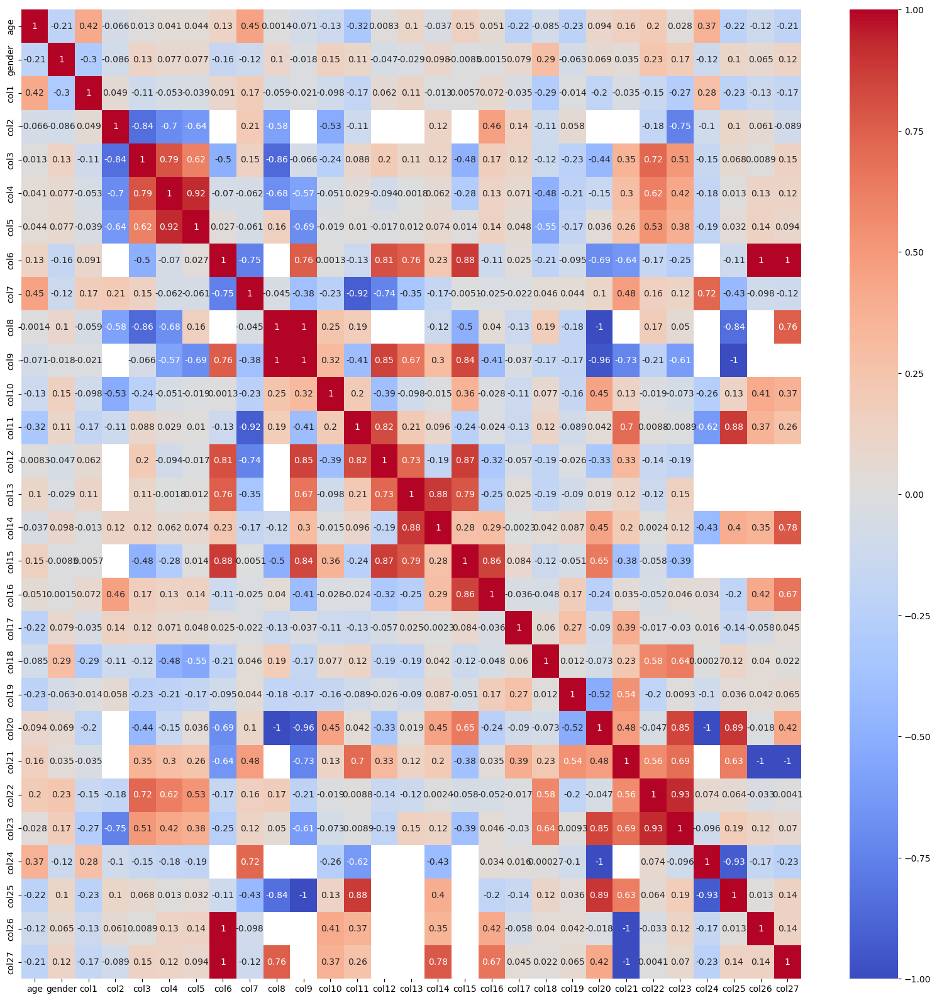

In [ ]:
plt.figure(figsize=(20, 20))
sb.heatmap(base_df.corr(numeric_only=True), vmin=-1, vmax=+1, annot=True, cmap="coolwarm")
plt.show()

### Использование missingno

<Axes: >

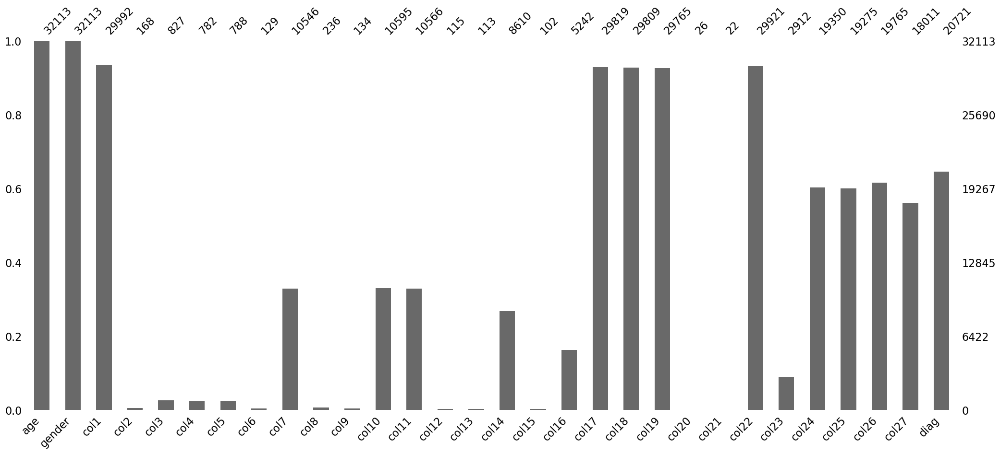

In [ ]:
import missingno as msno
msno.bar(base_df)

<Axes: >

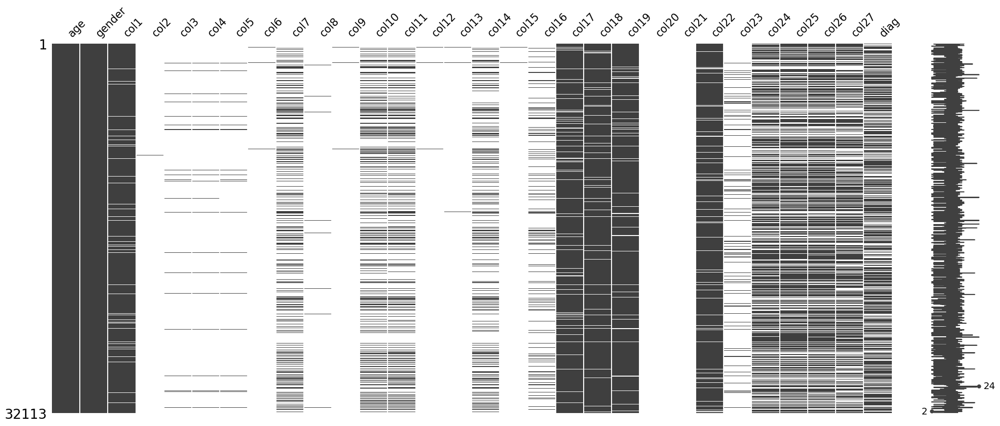

In [ ]:
msno.matrix(base_df)

<Axes: >

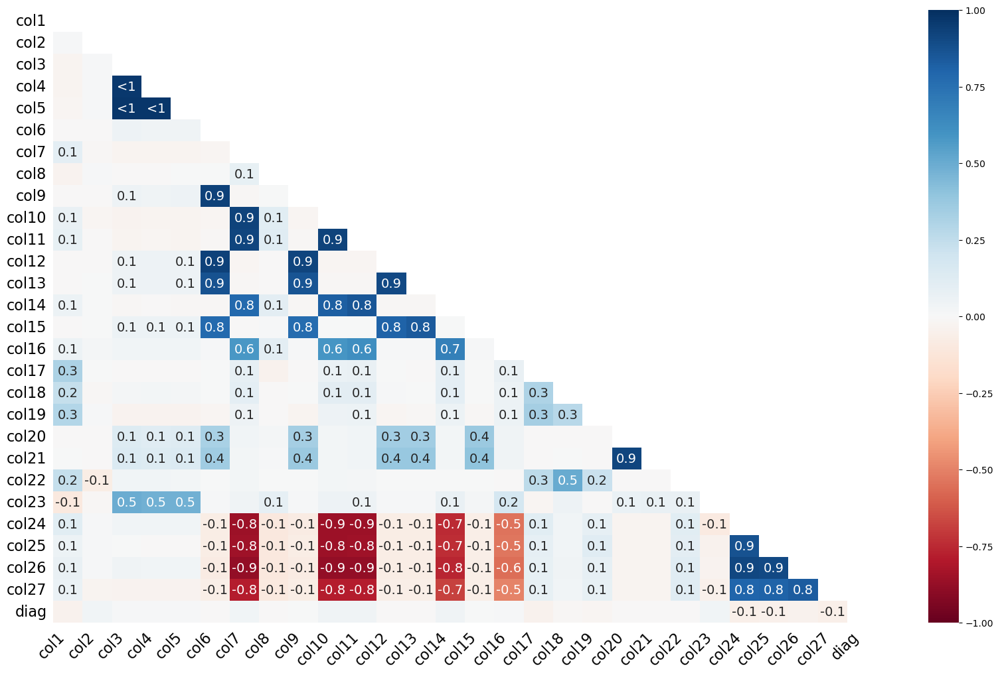

In [ ]:
msno.heatmap(base_df)

### В общем, удаляю сначала столбцы, заполненные менее, чем на 5% :_)
А таких столбцов многа... col2-6, 8, 9, 12, 13, 15, 20, 21

In [ ]:
perc5 = 0.07 * base_df.shape[0]
base_df.loc[:, base_df.count(axis=0) < perc5].count(axis=0)

col2     168
col3     827
col4     782
col5     788
col6     129
col8     236
col9     134
col12    115
col13    113
col15    102
col20     26
col21     22
dtype: int64

In [ ]:
delgap = base_df[base_df.columns[base_df.count(axis=0) > perc5]].copy()

In [ ]:
delgap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32113 entries, 0 to 32112
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     32113 non-null  int64  
 1   gender  32113 non-null  int64  
 2   col1    29992 non-null  float64
 3   col7    10546 non-null  float64
 4   col10   10595 non-null  float64
 5   col11   10566 non-null  float64
 6   col14   8610 non-null   float64
 7   col16   5242 non-null   float64
 8   col17   29819 non-null  float64
 9   col18   29809 non-null  float64
 10  col19   29765 non-null  float64
 11  col22   29921 non-null  float64
 12  col23   2912 non-null   float64
 13  col24   19350 non-null  float64
 14  col25   19275 non-null  float64
 15  col26   19765 non-null  float64
 16  col27   18011 non-null  float64
 17  diag    20721 non-null  object 
dtypes: float64(15), int64(2), object(1)
memory usage: 4.4+ MB


### А потом заполненные менее, чем на половину, строки

In [ ]:
delgap[delgap.count(axis=1) > delgap.shape[1] / 2].info()
delgap = delgap[delgap.count(axis=1) > delgap.shape[1] / 2]
# ну, кстати, таких целых 29826, нормас

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29826 entries, 0 to 32112
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     29826 non-null  int64  
 1   gender  29826 non-null  int64  
 2   col1    28589 non-null  float64
 3   col7    9960 non-null   float64
 4   col10   10080 non-null  float64
 5   col11   10173 non-null  float64
 6   col14   8513 non-null   float64
 7   col16   5216 non-null   float64
 8   col17   28726 non-null  float64
 9   col18   28670 non-null  float64
 10  col19   28581 non-null  float64
 11  col22   28648 non-null  float64
 12  col23   2861 non-null   float64
 13  col24   18629 non-null  float64
 14  col25   18577 non-null  float64
 15  col26   19004 non-null  float64
 16  col27   17438 non-null  float64
 17  diag    19712 non-null  object 
dtypes: float64(15), int64(2), object(1)
memory usage: 4.3+ MB


In [ ]:
delgap = delgap[delgap.count(axis=1) > delgap.shape[1] / 2]

In [ ]:
list(delgap.columns[delgap.count(axis=0) <= 0.30 * delgap.shape[0]]) #меньше чем на 30% заполненные, но их мы трогать не будем

['col14', 'col16', 'col23']

<Axes: >

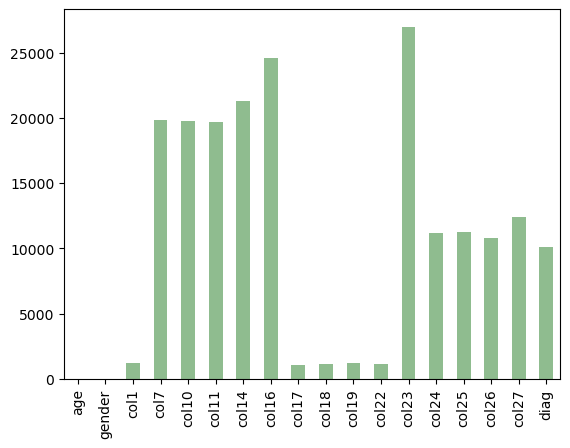

In [ ]:
# фсьо исчё многа пробузгав
np.sum(delgap.isna(), axis=0).plot.bar(color='darkseagreen')

# Теперь заполняем KNNImputer-ом
Как бы ни нахваливали MICE в интернете, лично мне мышки не подошли(

In [ ]:
delgap

,age,gender,col1,col7,col10,col11,col14,col16,col17,col18,col19,col22,col23,col24,col25,col26,col27,diag
0,86,0,8.0,NaN,NaN,NaN,NaN,NaN,5.4,4.04,411.0,92.0,NaN,50.0,40.0,8.0,2.0,NaN
1,64,0,10.0,NaN,NaN,NaN,NaN,NaN,7.9,4.33,265.0,128.0,NaN,68.0,25.0,4.0,3.0,NaN
2,10,0,4.0,NaN,NaN,NaN,NaN,NaN,6.1,NaN,248.0,147.0,NaN,34.0,58.0,5.0,3.0,J30;;
3,9,1,10.0,NaN,NaN,NaN,NaN,NaN,6.5,5.20,163.0,139.0,NaN,38.0,57.0,3.0,NaN,J04;;
4,15,0,35.0,NaN,NaN,NaN,NaN,NaN,5.6,4.30,266.0,135.0,NaN,59.0,37.0,2.0,1.0,J06;;
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32108,54,0,27.0,NaN,NaN,NaN,NaN,NaN,6.4,4.08,209.0,145.0,NaN,50.0,37.0,10.0,3.0,NaN
32109,43,0,25.0,57.4,5.6,31.0,5.6,0.4,10.0,4.31,349.0,123.0,NaN,NaN,NaN,NaN,NaN,N80;;
32110,0,1,4.0,NaN,NaN,NaN,NaN,NaN,6.0,3.32,256.0,100.0,NaN,34.0,49.0,9.0,NaN,J00;;
32111,67,0,13.0,NaN,NaN,NaN,NaN,NaN,8.7,4.40,128.0,150.0,NaN,50.0,38.0,8.0,4.0,K30;;


In [ ]:
#from fancyimpute import IterativeImputer
from sklearn.impute import KNNImputer
#impute = IterativeImputer()
impute = KNNImputer(n_neighbors=5) #IterativeImputer()
dataset1 = impute.fit_transform(delgap.iloc[:, :-1])

impute = IterativeImputer()
df.loc[:, df.columns.isin(notemptybut)] = impute.fit_transform(df.loc[:, df.columns.isin(notemptybut)])

In [ ]:
for col in range(dataset1.shape[1]):
    result = stats.anderson(dataset1[:, col], dist='norm')
    print(f'Андерсон-Дарлинг {delgap.columns[col]}',
f'{result.statistic} < критического значения? {result.statistic < result.critical_values[2]}')
print(f"\tУровень значимости 5%, крит.знач.: {result.critical_values[2]}")

Андерсон-Дарлинг age 773.5711758786529 < критического значения? False
Андерсон-Дарлинг gender 5828.687651558612 < критического значения? False
Андерсон-Дарлинг col1 1123.5652900506684 < критического значения? False
Андерсон-Дарлинг col7 465.587160633906 < критического значения? False
Андерсон-Дарлинг col10 89.93348985950433 < критического значения? False
Андерсон-Дарлинг col11 251.68283533599242 < критического значения? False
Андерсон-Дарлинг col14 108.58339416789022 < критического значения? False
Андерсон-Дарлинг col16 149.82181341072283 < критического значения? False
Андерсон-Дарлинг col17 82.92512806309605 < критического значения? False
Андерсон-Дарлинг col18 97.74085345983622 < критического значения? False
Андерсон-Дарлинг col19 40.63729780559515 < критического значения? False
Андерсон-Дарлинг col22 131.7328761106728 < критического значения? False
Андерсон-Дарлинг col23 257.60111909372426 < критического значения? False
Андерсон-Дарлинг col24 269.66629789522995 < критического значен

In [ ]:
#print(f"Уровень значимости 5%, крит.знач.: {result.critical_values[2]}")
for col in range(dataset1.shape[1]):
    result = stats.shapiro(dataset1[:, col])
    print(f'Шапиро {delgap.columns[col]} {result.statistic}, p-значение {result.pvalue}')

Шапиро age 0.9224601984024048, p-значение 0.0
Шапиро gender 0.612250566482544, p-значение 0.0
Шапиро col1 0.8816123604774475, p-значение 0.0
Шапиро col7 0.9535369873046875, p-значение 0.0
Шапиро col10 0.9881072044372559, p-значение 4.456129116552918e-43
Шапиро col11 0.9784418344497681, p-значение 0.0
Шапиро col14 0.9797075986862183, p-значение 0.0
Шапиро col16 0.968035101890564, p-значение 0.0
Шапиро col17 0.9894367456436157, p-значение 3.754639105311915e-41
Шапиро col18 0.9742357730865479, p-значение 0.0
Шапиро col19 0.9942135810852051, p-значение 4.437868801914337e-32
Шапиро col22 0.9653097987174988, p-значение 0.0
Шапиро col23 0.9581095576286316, p-значение 0.0
Шапиро col24 0.9633172154426575, p-значение 0.0
Шапиро col25 0.9907890558242798, p-значение 5.536886162357291e-39
Шапиро col26 0.9707615375518799, p-значение 0.0
Шапиро col27 0.8469856977462769, p-значение 0.0


C:\Users\hasee\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Ничего нормального в этом жештоком мире

for i in cols:
    c = f'col{i}'
    fig = px.histogram(df, x=c, nbins = 60, opacity = 0.7)
    fig.show()

# Объединение с диагнозами

In [ ]:
dataset1 = pd.DataFrame(dataset1, columns = delgap.columns[:-1], index=delgap.index)
dataset1['diag'] = delgap['diag']
dataset1['diag'] = dataset1['diag'].str.replace(';+', ';', regex=True)
dataset1['diag'] = dataset1['diag'].str.replace(';$', '', regex=True)
dataset1['diag'] = dataset1['diag'].str.split(';')
dataset1['diag'].fillna('Другое', inplace=True)

In [ ]:
dataset1['diag'] = dataset1['diag'].apply(lambda x: ['Другое'] if x == 'Другое' else x)

In [ ]:
base_df.to_excel('basedf.xlsx', index=False)
delgap.to_excel('delgap.xlsx', index=False)

In [ ]:
from sklearn import preprocessing
mlb = preprocessing.MultiLabelBinarizer(sparse_output=True)
enc_df = dataset1.join(pd.DataFrame.sparse.from_spmatrix(mlb.fit_transform(dataset1['diag']),
        columns=mlb.classes_, index=dataset1.index))

In [ ]:
#enc_df.drop('diag', axis=1, inplace=True)
enc_df

,age,gender,col1,col7,col10,col11,col14,col16,col17,col18,col19,col22,col23,col24,col25,col26,col27,diag,A02,A04,A08,A09,A23,A26,A38,A46,A54,B00,B01,B02,B07,B08,B09,B12,B17,B18,B20,B25,B27,B34,B35,B36,B37,B80,B82,B85,B86,B88,B89,B94,...,T34,T35,T75,T78,T81,T84,T88,T90,T91,T92,T93,T94,T95,U07,U09,U11,W54,W55,Y84,Z00,Z01,Z02,Z03,Z04,Z09,Z10,Z11,Z20,Z22,Z23,Z24,Z25,Z26,Z27,Z29,Z30,Z32,Z34,Z35,Z39,Z43,Z51,Z54,Z71,Z75,Z87,Z93,Z94,Z98,Другое
0,86.0,0.0,8.0,56.00,6.78,27.18,3.82,0.68,5.4,4.040,411.0,92.0,28.94,50.0,40.0,8.0,2.0,[Другое],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,64.0,0.0,10.0,52.04,7.22,35.22,2.08,0.48,7.9,4.330,265.0,128.0,39.26,68.0,25.0,4.0,3.0,[Другое],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,10.0,0.0,4.0,50.94,7.70,38.38,2.56,0.50,6.1,4.978,248.0,147.0,42.14,34.0,58.0,5.0,3.0,[J30],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,9.0,1.0,10.0,45.92,6.90,40.08,2.98,0.54,6.5,5.200,163.0,139.0,40.40,38.0,57.0,3.0,1.4,[J04],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,15.0,0.0,35.0,55.14,7.38,35.14,2.00,0.44,5.6,4.300,266.0,135.0,39.40,59.0,37.0,2.0,1.0,[J06],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32108,54.0,0.0,27.0,53.84,8.32,33.90,3.44,0.58,6.4,4.080,209.0,145.0,42.74,50.0,37.0,10.0,3.0,[Другое],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
32109,43.0,0.0,25.0,57.40,5.60,31.00,5.60,0.40,10.0,4.310,349.0,123.0,36.34,59.2,26.8,3.4,2.2,[N80],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
32110,0.0,1.0,4.0,26.24,6.26,59.42,4.04,0.54,6.0,3.320,256.0,100.0,32.26,34.0,49.0,9.0,2.6,[J00],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
32111,67.0,0.0,13.0,53.66,7.08,36.06,1.22,0.32,8.7,4.400,128.0,150.0,38.64,50.0,38.0,8.0,4.0,[K30],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
enc_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29826 entries, 0 to 32112
Data columns (total 789 columns):
 #    Column  Dtype           
---   ------  -----           
 0    age     float64         
 1    gender  float64         
 2    col1    float64         
 3    col7    float64         
 4    col10   float64         
 5    col11   float64         
 6    col14   float64         
 7    col16   float64         
 8    col17   float64         
 9    col18   float64         
 10   col19   float64         
 11   col22   float64         
 12   col23   float64         
 13   col24   float64         
 14   col25   float64         
 15   col26   float64         
 16   col27   float64         
 17   diag    object          
 18   A02     Sparse[int32, 0]
 19   A04     Sparse[int32, 0]
 20   A08     Sparse[int32, 0]
 21   A09     Sparse[int32, 0]
 22   A23     Sparse[int32, 0]
 23   A26     Sparse[int32, 0]
 24   A38     Sparse[int32, 0]
 25   A46     Sparse[int32, 0]
 26   A54     Sparse[i

In [ ]:
diags_desc = enc_df.filter(regex='[A-Zа-я]').sum().sort_values(ascending=False)
print(diags_desc[diags_desc >= 100])
print('> 200', diags_desc[diags_desc >= 200].shape)
print('> 100', diags_desc[diags_desc >= 100].shape)

Другое    10561
Z00        4305
I11        1725
Z03         963
I67         891
Z01         874
J02         872
Z10         835
Z34         780
J00         780
E11         750
J06         655
Z02         574
H52         555
G93         543
M42         365
D50         347
Z23         341
Z27         341
H26         322
G90         307
M54         291
H35         278
J20         276
I20         248
J30         231
M51         227
Z35         217
I25         214
M17         213
J35         210
K29         210
H40         180
L20         168
H90         164
N95         154
J04         147
N60         137
E66         125
M19         121
Z25         120
K59         112
J45         111
D25         107
D23         107
K86         103
E78         103
C50         102
Z24         100
N18         100
dtype: int32
> 200 (32,)
> 100 (50,)


<Axes: >

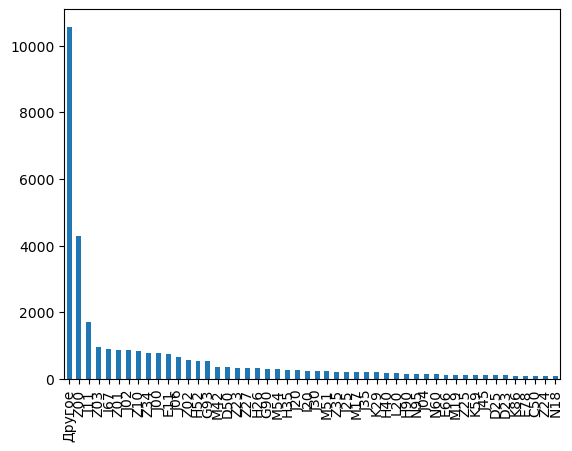

In [ ]:
diags_desc[diags_desc >= 100].plot.bar()

In [ ]:
most_diag = diags_desc[diags_desc >= 100]
needless = diags_desc[~(diags_desc >= 100)]
needless

J01    98
I48    98
M16    95
I83    95
J34    95
       ..
I33     1
I27     1
I26     1
Q70     1
A02     1
Length: 721, dtype: int32

In [ ]:
sneedless = set(needless.index)
def separateDiags(x):
    if not (set(x).intersection(sneedless)):
        return x
    else:
        x = set(x).difference(sneedless)
        x.add('Другое')
        return list(x)

In [ ]:
dataset1['diag'] = dataset1['diag'].apply(lambda x: separateDiags(x))
dataset1

,age,gender,col1,col7,col10,col11,col14,col16,col17,col18,col19,col22,col23,col24,col25,col26,col27,diag
0,86.0,0.0,8.0,56.00,6.78,27.18,3.82,0.68,5.4,4.040,411.0,92.0,28.94,50.0,40.0,8.0,2.0,[Другое]
1,64.0,0.0,10.0,52.04,7.22,35.22,2.08,0.48,7.9,4.330,265.0,128.0,39.26,68.0,25.0,4.0,3.0,[Другое]
2,10.0,0.0,4.0,50.94,7.70,38.38,2.56,0.50,6.1,4.978,248.0,147.0,42.14,34.0,58.0,5.0,3.0,[J30]
3,9.0,1.0,10.0,45.92,6.90,40.08,2.98,0.54,6.5,5.200,163.0,139.0,40.40,38.0,57.0,3.0,1.4,[J04]
4,15.0,0.0,35.0,55.14,7.38,35.14,2.00,0.44,5.6,4.300,266.0,135.0,39.40,59.0,37.0,2.0,1.0,[J06]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32108,54.0,0.0,27.0,53.84,8.32,33.90,3.44,0.58,6.4,4.080,209.0,145.0,42.74,50.0,37.0,10.0,3.0,[Другое]
32109,43.0,0.0,25.0,57.40,5.60,31.00,5.60,0.40,10.0,4.310,349.0,123.0,36.34,59.2,26.8,3.4,2.2,[Другое]
32110,0.0,1.0,4.0,26.24,6.26,59.42,4.04,0.54,6.0,3.320,256.0,100.0,32.26,34.0,49.0,9.0,2.6,[J00]
32111,67.0,0.0,13.0,53.66,7.08,36.06,1.22,0.32,8.7,4.400,128.0,150.0,38.64,50.0,38.0,8.0,4.0,[Другое]


In [ ]:
dataset1['diag'][20:]

20                    [Z00, J06]
21       [Другое, E66, E11, I11]
22                      [Другое]
23          [Z10, Z10, J45, Z10]
24                      [Другое]
                  ...           
32108                   [Другое]
32109                   [Другое]
32110                      [J00]
32111                   [Другое]
32112                   [Другое]
Name: diag, Length: 29806, dtype: object

In [ ]:
from sklearn import preprocessing
mlb = preprocessing.MultiLabelBinarizer(sparse_output=True)
enc_df = dataset1.join(pd.DataFrame.sparse.from_spmatrix(mlb.fit_transform(dataset1['diag']),
        columns=mlb.classes_, index=dataset1.index))

In [ ]:
enc_df

,age,gender,col1,col7,col10,col11,col14,col16,col17,col18,col19,col22,col23,col24,col25,col26,col27,diag,C50,D23,D25,D50,E11,E66,E78,G90,G93,H26,H35,H40,H52,H90,I11,I20,I25,I67,J00,J02,J04,J06,J20,J30,J35,J45,K29,K59,K86,L20,M17,M19,M42,M51,M54,N18,N60,N95,Z00,Z01,Z02,Z03,Z10,Z23,Z24,Z25,Z27,Z34,Z35,Другое
0,86.0,0.0,8.0,56.00,6.78,27.18,3.82,0.68,5.4,4.040,411.0,92.0,28.94,50.0,40.0,8.0,2.0,[Другое],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,64.0,0.0,10.0,52.04,7.22,35.22,2.08,0.48,7.9,4.330,265.0,128.0,39.26,68.0,25.0,4.0,3.0,[Другое],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,10.0,0.0,4.0,50.94,7.70,38.38,2.56,0.50,6.1,4.978,248.0,147.0,42.14,34.0,58.0,5.0,3.0,[J30],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,9.0,1.0,10.0,45.92,6.90,40.08,2.98,0.54,6.5,5.200,163.0,139.0,40.40,38.0,57.0,3.0,1.4,[J04],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,15.0,0.0,35.0,55.14,7.38,35.14,2.00,0.44,5.6,4.300,266.0,135.0,39.40,59.0,37.0,2.0,1.0,[J06],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32108,54.0,0.0,27.0,53.84,8.32,33.90,3.44,0.58,6.4,4.080,209.0,145.0,42.74,50.0,37.0,10.0,3.0,[Другое],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
32109,43.0,0.0,25.0,57.40,5.60,31.00,5.60,0.40,10.0,4.310,349.0,123.0,36.34,59.2,26.8,3.4,2.2,[Другое],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
32110,0.0,1.0,4.0,26.24,6.26,59.42,4.04,0.54,6.0,3.320,256.0,100.0,32.26,34.0,49.0,9.0,2.6,[J00],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
32111,67.0,0.0,13.0,53.66,7.08,36.06,1.22,0.32,8.7,4.400,128.0,150.0,38.64,50.0,38.0,8.0,4.0,[Другое],0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
diags_enc = enc_df.filter(regex='[A-Zа-я]').sum().sort_values(ascending=False)
diags_enc

Другое    17755
Z00        4305
I11        1725
Z03         963
I67         891
Z01         874
J02         872
Z10         835
Z34         780
J00         780
E11         750
J06         655
Z02         574
H52         555
G93         543
M42         365
D50         347
Z27         341
Z23         341
H26         322
G90         307
M54         291
H35         278
J20         276
I20         248
J30         231
M51         227
Z35         217
I25         214
M17         213
K29         210
J35         210
H40         180
L20         168
H90         164
N95         154
J04         147
N60         137
E66         125
M19         121
Z25         120
K59         112
J45         111
D23         107
D25         107
K86         103
E78         103
C50         102
N18         100
Z24         100
dtype: int32

<Axes: >

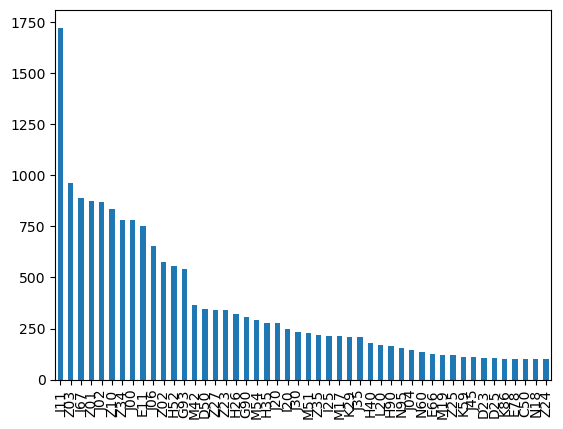

In [ ]:
diags_enc[2:].plot.bar()

In [ ]:
enc_df.to_excel('WithDiagsKNN.xlsx', index=False)

# Нормализация данных

In [ ]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
df_norm = trunc_df.copy()
df_norm.loc[:, ~df_norm.columns.isin(catorelse)] = sc.fit_transform(df_norm.loc[:, ~df_norm.columns.isin(catorelse)])

In [ ]:
df_norm.describe()

In [ ]:
corrken = df_norm.corr('kendall')

In [ ]:
mask = np.triu(np.ones_like(corrken, dtype=bool))
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))
# Generate a custom diverging colormap
cmap = sb.color_palette("mako", as_cmap=True)#sb.diverging_palette(230, 20, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sb.heatmap(corrken, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [ ]:
df.drop(df[<some boolean condition>].index)

In [ ]:
print(diag.describe(include=['object', 'bool']))

In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(trunc_df, title="trunc_df")
profile.to_file("C:/Users/hasee/Documents/BaikalMedBlood/trunc_df.html")

In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="df_norm")
profile.to_file("C:/Users/hasee/Documents/BaikalMedBlood/df_norm.html")

In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(blood, title="Общий анализ крови")
profile.to_file("C:/Users/hasee/Documents/BaikalMedBlood/merged_df.html")